In [1]:
import pickle
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as K
import tensorflow as tf
from src.models.train_model import train_svm
from src.models.detectors import Detector
from tqdm import tqdm
from copy import deepcopy
from src.data.dataset_loaders import DatasetLoader, AerialCarsDatasetLoader
from typing import Tuple
from src.features.pipelines import RawImageToFeatures
from src.features.processors import NormImage, Resize
from src.data.image_loaders import AerialCarsFixedSizeImageLoader
from src.models.classifiers import ResnetModelWrapper
from src.models.detectors import SliderDetector, SliderProbDetector
from src.data.sliders import SlidingWindow
from src.features.processors import RotateToHorizontal, Resize
from src.features.descriptors import HOGDescriptor, LBPDescriptor
import matplotlib.pyplot as plt
from src.models.classifiers import ProbSVMModelWrapper

## Aerial Cars Dataset

In [2]:
# DATA_PATH = '../../data/processed/aerial-cars-dataset/data.pickle'
DATA_PATH = '../../data/processed/aerial-cars-dataset/data_features_fixed.pickle'

In [3]:
with open(DATA_PATH, 'rb') as f:
    data = pickle.load(f)

### SVM training

In [4]:
model, report = train_svm(data, test_size=0.1, probability=True)

In [5]:
print(report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        23
           1       1.00      1.00      1.00        43

    accuracy                           1.00        66
   macro avg       1.00      1.00      1.00        66
weighted avg       1.00      1.00      1.00        66



### Validation

In [6]:
def validate_model(
    dataset_loader: DatasetLoader,
    input_folder_filepath: str,
    images_files_types: Tuple[str],
    annotations_files_types: Tuple[str],
    detector: Detector,
    workers: int = 0
):

    images = dataset_loader.load_dataset(
        input_folder_filepath,
        images_files_types,
        annotations_files_types,
        False
    )

    processed_images = []

    for image in tqdm(images):
        processed_images.append(
            detector(deepcopy(image), workers)
        )

    return processed_images

In [7]:
# class ModelWrapper:

#     def __init__(self, model):
#         self.model = model

#     def predict(self, x):
#         return self.model.predict(x)

In [8]:
BND_BOX_SIZE = (100, 100)

dataset_loader = AerialCarsDatasetLoader(
    image_loader=AerialCarsFixedSizeImageLoader(
        bnd_box_size=BND_BOX_SIZE
    )
)

process_pipeline = RawImageToFeatures(
    processors=[
        RotateToHorizontal(),
        Resize(
            output_size=(64, 64)
        )
    ],
    descriptors=[
        HOGDescriptor(
            orientations = 9,
            cells_per_block = (2, 2),
            pixels_per_cell = (4, 4),
            multichannel = True,
            visualize = True
        ),
        LBPDescriptor(
            bins = 256,
            range = (0, 256)
        )
    ]
)

sliding_window = SlidingWindow(
    step_size=20,
    window_size=BND_BOX_SIZE
)

slider_detector = SliderProbDetector(
    sliding_window=sliding_window,
    process_pipeline=process_pipeline,
    classifier=ProbSVMModelWrapper(model),
    treshold=0.95,
    nms_overlap=0.4
)

In [11]:
processed_images = validate_model(
    dataset_loader=dataset_loader,
    input_folder_filepath='../../data/raw/aerial-cars-dataset/val',
    images_files_types=('jpg', 'JPG', 'png'),
    annotations_files_types=('txt',),
    detector=slider_detector,
    workers=7
)

 20%|██        | 1/5 [02:40<10:41, 160.35s/it]35
Overlap is 0.6039603960396039
Overlap is 0.40594059405940597
Overlap is 0.6039603960396039
Overlap is 0.801980198019802
Overlap is 0.801980198019802
Overlap is 0.6039603960396039
Overlap is 0.801980198019802
Overlap is 0.801980198019802
Overlap is 9.802960494069208e-05
Overlap is 0.2079207920792079
Overlap is 0.801980198019802
Overlap is 0.801980198019802
Overlap is 0.801980198019802
Overlap is 0.801980198019802
Overlap is 0.801980198019802
Overlap is 0.801980198019802
Overlap is 0.801980198019802
Overlap is 0.6039603960396039
Overlap is 0.40594059405940597
Overlap is 0.2079207920792079
Overlap is 0.801980198019802
Overlap is 0.801980198019802
Overlap is 0.3255563180080384
16
 40%|████      | 2/5 [05:19<07:59, 159.88s/it]40
Overlap is 0.801980198019802
Overlap is 0.3255563180080384
Overlap is 0.40594059405940597
Overlap is 0.16674835800411725
Overlap is 0.801980198019802
Overlap is 0.12557592392902656
Overlap is 0.0059798059013822175
Ove

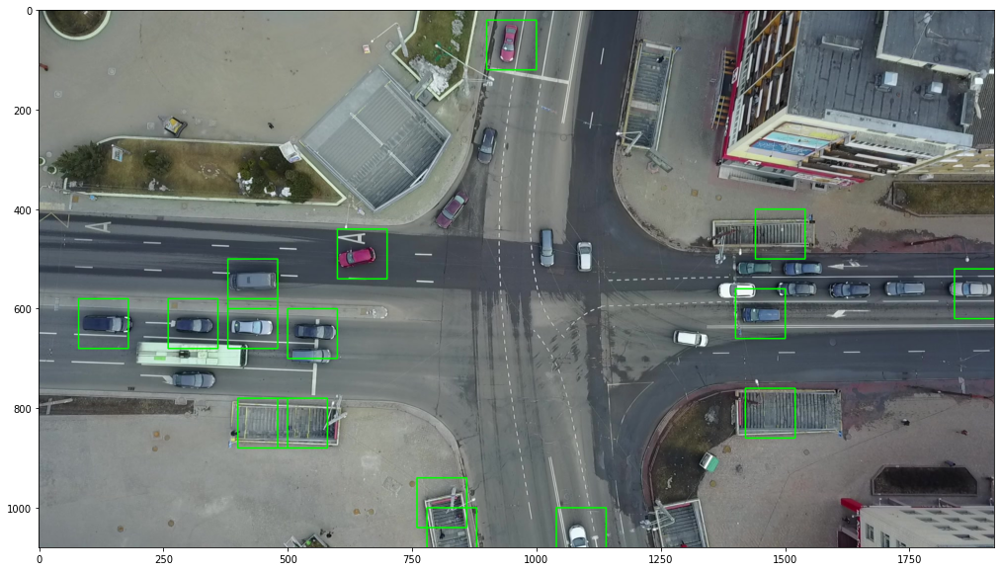

In [12]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images[0][0])

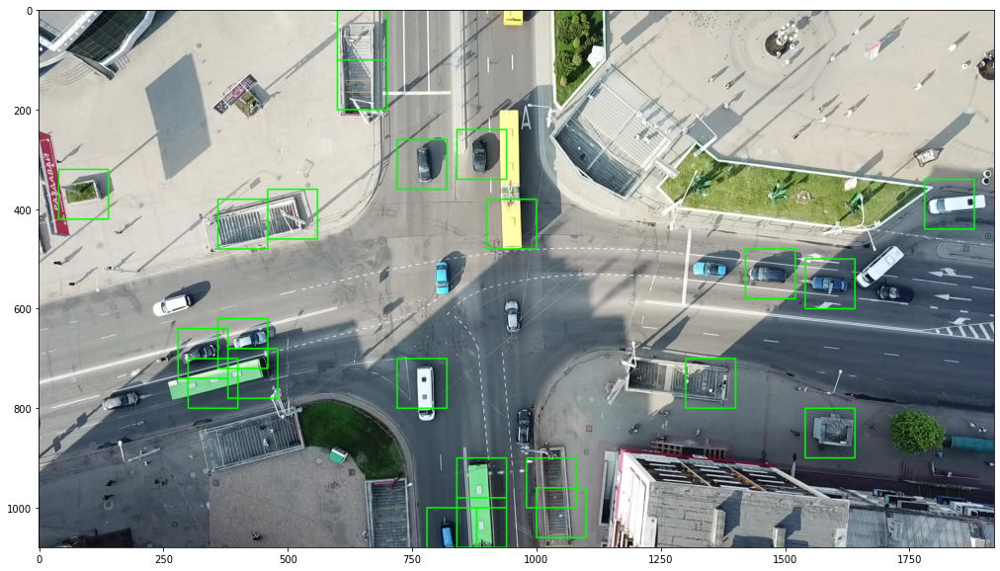

In [13]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images[1][0])

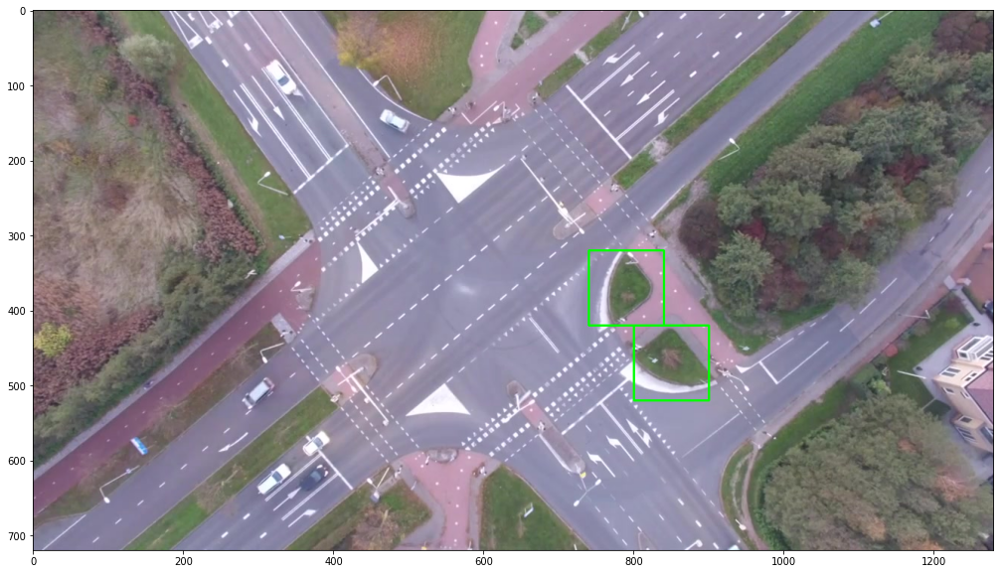

In [14]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images[2][0])

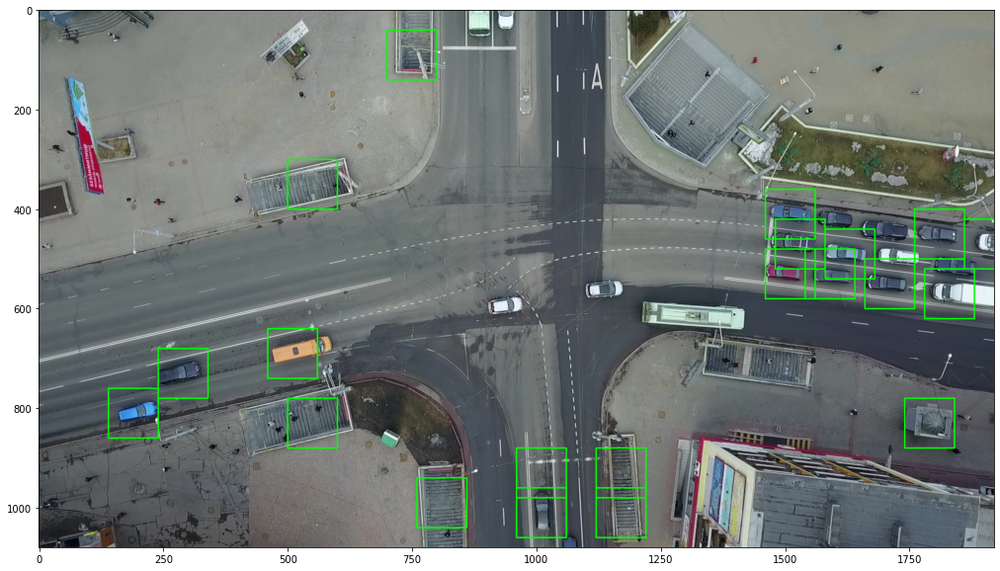

In [15]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images[3][0])

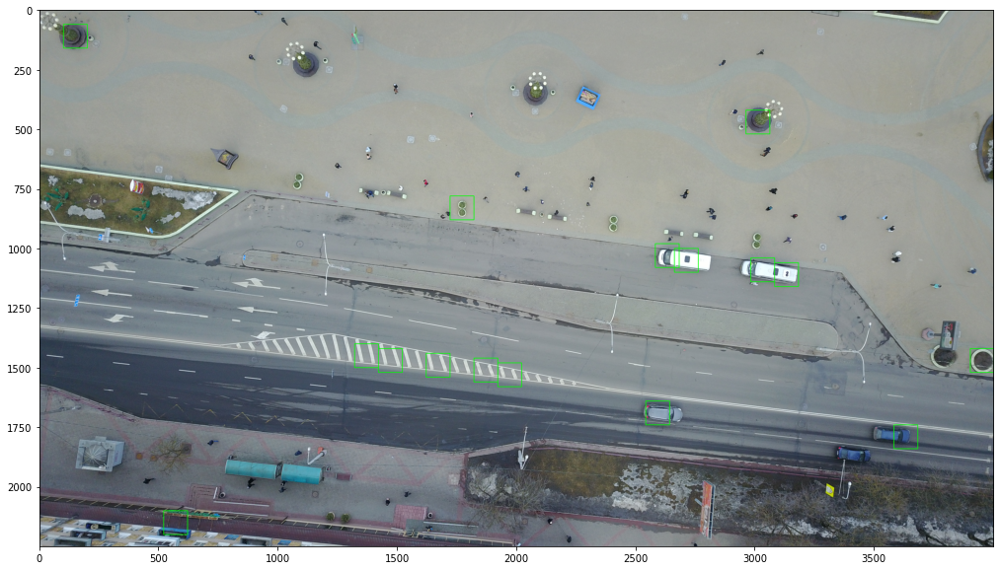

In [16]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images[4][0])